# Embeddings Clustering Analysis

* Get embeddings from custom LGM, and Neural Admixture (Q)
* Dimensionality reduce to 2 dims using UMAP (not PCA)
* Cluster using modern techniques, compare clusterings
* Also compare output of NN against true values using RMSE

## Setup

In [2]:
## Import meta setup

# In order to force reload any changes done to the models package files
%load_ext autoreload
%autoreload 2

# Allow import from our custom lib python files
import sys
import os

module_path = os.path.abspath(os.path.join('../src'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [3]:
import os
from timeit import default_timer
import json
import collections

from lib.params import * # device, use_cuda, Checkpoint, various saving strs
from lib.datasets import KingMatrixDataset, FilledMatrixDataset
from lib.models import BaseTransformer
from lib.saveload import *


import pandas as pd
import numpy as np
from umap import UMAP
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering
from sklearn.metrics import (zero_one_loss, rand_score, adjusted_rand_score, 
                            completeness_score, mutual_info_score, 
                            adjusted_mutual_info_score, normalized_mutual_info_score)
# Viz
import seaborn as sns
import matplotlib
from matplotlib import pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots
# pio.renderers.default = "notebook+plotly_mimetype+png"
# For some reason, the correct setting to get the plots to show up in Quarto HTML?
pio.renderers.default = "plotly_mimetype+notebook_connected+png"

## Load Model Output and Data

### Source Data

In [4]:
# The official 1000 genome sample names to popcodes
sample_to_popcode = pd.read_csv("../Data/igsr_samples.tsv", sep="\t")[["Sample name", "Population code", "Superpopulation code", "Superpopulation name"]].dropna()
sample_to_label = sample_to_popcode.set_index("Sample name").to_dict()["Population code"]
pop_to_superpop = sample_to_popcode.set_index("Population code").to_dict()["Superpopulation code"]
superpop_to_name = sample_to_popcode.set_index("Superpopulation code").to_dict()["Superpopulation name"]
pop_to_supername = sample_to_popcode.set_index("Population code").to_dict()["Superpopulation name"]

# Labels as descriptive names
label_names = pd.read_csv("../Output/Heritage_UMAP/umap_embeddings.csv").iloc[:, -1]
# Labels as ints
y = pd.read_csv("../Output/Heritage_UMAP/labels_file_series.csv", index_col=0).to_numpy().flatten()
# Label int to popcode
king_popcodes = pd.read_csv("../Output/Heritage_UMAP/variable_to_integer_conversion_tribe_string_labels.csv", index_col=0)
# Labels as popcodes
label_codes = pd.read_csv("../Output/Heritage_UMAP/labels_file_series.csv", index_col=0)\
                .replace(king_popcodes.set_index("0").to_dict()["1"])["0"]
# Labels as superpops
label_superpops = label_codes.replace(pop_to_superpop).replace(superpop_to_name)
label_superpops_y = label_superpops.astype("category").cat.codes

king_matrix = pd.read_csv("../Data/king_matrix.csv").fillna(0).to_numpy()
X = king_matrix

X_filled = FilledMatrixDataset("../Data/king_matrix.csv").X.to_numpy()

print(label_names, label_codes, y)
X

0       British\nEngland and Scotland
1       British\nEngland and Scotland
2       British\nEngland and Scotland
3       British\nEngland and Scotland
4       British\nEngland and Scotland
                    ...              
2498      Gujarati Indian\nHouston,TX
2499      Gujarati Indian\nHouston,TX
2500      Gujarati Indian\nHouston,TX
2501      Gujarati Indian\nHouston,TX
2502      Gujarati Indian\nHouston,TX
Name: Label, Length: 2503, dtype: object 0       GBR
1       GBR
2       GBR
3       GBR
4       GBR
       ... 
2498    GIH
2499    GIH
2500    GIH
2501    GIH
2502    GIH
Name: 0, Length: 2503, dtype: object [10 10 10 ... 11 11 11]


array([[-0.0091, -0.0023, -0.0143, ..., -0.0278, -0.034 , -0.0348],
       [ 0.    , -0.0004,  0.0173, ..., -0.0066,  0.0074, -0.0152],
       [ 0.    ,  0.    ,  0.0147, ..., -0.0347, -0.0333, -0.0283],
       ...,
       [ 0.    ,  0.    ,  0.    , ...,  0.0187,  0.0126,  0.015 ],
       [ 0.    ,  0.    ,  0.    , ...,  0.    ,  0.0161, -0.0096],
       [ 0.    ,  0.    ,  0.    , ...,  0.    ,  0.    ,  0.0181]])

### 3D New Data Model Embeddings


In [20]:
embeddings_rot = np.load("../Output/Runs/test10/Test_15_rot_f_1h_embeddings_REDUCED_20.npy") ## The best one?

0       GBR
20      GBR
40      GBR
60      FIN
80      GBR
       ... 
2420    GIH
2440    GIH
2460    GIH
2480    GIH
2500    GIH
Name: 0, Length: 126, dtype: object

In [29]:
rot_inds = list(range(0, 2503, 20))
rot_labels = label_codes[rot_inds]
rot_X = X[rot_inds][:, rot_inds]

In [30]:
rot_labels, rot_X.shape, X.shape

(0       GBR
 20      GBR
 40      GBR
 60      FIN
 80      GBR
        ... 
 2420    GIH
 2440    GIH
 2460    GIH
 2480    GIH
 2500    GIH
 Name: 0, Length: 126, dtype: object,
 (126, 126),
 (2503, 2503))

In [12]:
rot_labels.astype("category").cat.codes

0       10
20      10
40      10
60       9
80      10
        ..
2420    11
2440    11
2460    11
2480    11
2500    11
Length: 126, dtype: int8

### Model Embeddings

In [6]:
# embeddings = np.load("../Output/Runs/test6/Test_7_embeddings.npy")
# embeddings = np.load("../Output/Runs/test8/Test_10_tanh_embeddings.npy")
embeddings = np.load("../Output/Runs/test6/Test_6_embeddings.npy") ## The best one?
# embeddings = np.load("../Output/Runs/test9/Test_11_fmat_1h_attention_maps_embeddings.npy", allow_pickle=True).item()["embeddings"]
embeddings.shape

(2503, 2504)

### Neural ADMIXTURE

In [7]:
# Get the "embeddings"
na_Q = pd.read_csv('../src/neural-admixture/data/allchms/data/GT_train.Q', sep=" ", header=None).to_numpy()
na_P = pd.read_csv('../src/neural-admixture/data/allchms/data/GT_train.P', sep=" ", header=None).to_numpy()
na_full = np.matmul(na_Q, na_P)
na_df = pd.DataFrame(na_full)
na_df

,0,1,2,3,4,5,6,7,8,9,...,839619,839620,839621,839622,839623,839624,839625,839626,839627,839628
0,0.139660,0.004630,0.467593,0.00,0.01929,0.455247,0.073302,0.015432,0.010802,0.001543,...,0.0,0.000772,0.0,0.046296,0.027778,0.483025,0.134259,0.077160,0.0,0.035494
1,0.139660,0.004630,0.467593,0.00,0.01929,0.455247,0.073302,0.015432,0.010802,0.001543,...,0.0,0.000772,0.0,0.046296,0.027778,0.483025,0.134259,0.077160,0.0,0.035494
2,0.139660,0.004630,0.467593,0.00,0.01929,0.455247,0.073302,0.015432,0.010802,0.001543,...,0.0,0.000772,0.0,0.046296,0.027778,0.483025,0.134259,0.077160,0.0,0.035494
3,0.139660,0.004630,0.467593,0.00,0.01929,0.455247,0.073302,0.015432,0.010802,0.001543,...,0.0,0.000772,0.0,0.046296,0.027778,0.483025,0.134259,0.077160,0.0,0.035494
4,0.139660,0.004630,0.467593,0.00,0.01929,0.455247,0.073302,0.015432,0.010802,0.001543,...,0.0,0.000772,0.0,0.046296,0.027778,0.483025,0.134259,0.077160,0.0,0.035494
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2960,0.163333,0.083333,0.440000,0.01,0.00000,0.213333,0.340000,0.016667,0.016667,0.013333,...,0.0,0.000000,0.0,0.003333,0.030000,0.380000,0.026667,0.013333,0.0,0.043333
2961,0.163333,0.083333,0.440000,0.01,0.00000,0.213333,0.340000,0.016667,0.016667,0.013333,...,0.0,0.000000,0.0,0.003333,0.030000,0.380000,0.026667,0.013333,0.0,0.043333
2962,0.163333,0.083333,0.440000,0.01,0.00000,0.213333,0.340000,0.016667,0.016667,0.013333,...,0.0,0.000000,0.0,0.003333,0.030000,0.380000,0.026667,0.013333,0.0,0.043333
2963,0.163333,0.083333,0.440000,0.01,0.00000,0.213333,0.340000,0.016667,0.016667,0.013333,...,0.0,0.000000,0.0,0.003333,0.030000,0.380000,0.026667,0.013333,0.0,0.043333


In [9]:
# The data that was fed to the network, including the sample names that translate to pop codes
na_labels = pd.read_csv('../src/neural-admixture/data/allchms/data/whole_filt_ld_single.fam', sep="\t", header=None)[[1]]

# Drop rows from NA dataset that don't have popcode for their sample name
na_df = na_df[na_labels[1].isin(sample_to_popcode["Sample name"])]
na_labels = na_labels[na_labels[1].isin(sample_to_popcode["Sample name"])]
na_label_codes = na_labels.replace(sample_to_label)

## Truncate to pop codes present also in King matrix
na_df = na_df[na_label_codes[1].isin(king_popcodes["1"])]
na_label_codes = na_label_codes[na_label_codes[1].isin(king_popcodes["1"])]
na_y = na_label_codes.replace(king_popcodes.set_index("1").to_dict()["0"]).to_numpy()
na_label_superpops = na_label_codes.replace(pop_to_superpop).replace(superpop_to_name)[1]

print(na_df, na_y)
na_label_codes

        0         1         2         3         4         5         6       \
0     0.139660  0.004630  0.467593  0.000000  0.019290  0.455247  0.073302   
1     0.139660  0.004630  0.467593  0.000000  0.019290  0.455247  0.073302   
2     0.139660  0.004630  0.467593  0.000000  0.019290  0.455247  0.073302   
3     0.139660  0.004630  0.467593  0.000000  0.019290  0.455247  0.073302   
4     0.139660  0.004630  0.467593  0.000000  0.019290  0.455247  0.073302   
...        ...       ...       ...       ...       ...       ...       ...   
2604  0.190647  0.042446  0.548201  0.014388  0.018705  0.297842  0.089928   
2605  0.190647  0.042446  0.548201  0.014388  0.018705  0.297842  0.089928   
2606  0.190647  0.042446  0.548201  0.014388  0.018705  0.297842  0.089928   
2607  0.190647  0.042446  0.548201  0.014388  0.018705  0.297842  0.089928   
2608  0.190647  0.042446  0.548201  0.014388  0.018705  0.297842  0.089928   

        7         8         9       ...    839619    839620  83

,1
0,GWD
1,GWD
2,GWD
3,GWD
4,GWD
...,...
2604,GIH
2605,GIH
2606,GIH
2607,GIH


### Plotly Color Setup

In [37]:
scales = {"European Ancestry": "Oryel", 
          "East Asian Ancestry": "Purples", 
          "American Ancestry": "Reds",
          "South Asian Ancestry": "Blues", 
          "African Ancestry": "Emrld"}

pop_to_supername = dict(sorted(pop_to_supername.items(), key=lambda kv: kv[1]))
pop_to_supername.pop("IBS,MSL", None)
pop_to_supername.pop("GWJ", None)
pop_to_supername.pop("GWF", None)
pop_to_supername.pop("GWW", None)

popname_to_code = {k: label_codes["0"][i] for i, k in enumerate(label_names)}
popname_to_code = {list(popname_to_code.keys())[list(popname_to_code.values()).index(v)] : v for v in pop_to_supername.keys()}

sf = 0.25 # The amount of the colorscale to start at, aka remove this amount of the initial scale
v, c = np.unique(list(pop_to_supername.values()), return_counts=True)
colors = np.concatenate([px.colors.sample_colorscale(scales[x], [(n)/(c[i] - 1)*(1 - sf) + sf for n in range(c[i])]) for i, x in enumerate(v)])

pop_to_color = {k : colors[i] for i, k in enumerate(pop_to_supername.keys())}
popname_to_color = { k : pop_to_color[v] for k, v in popname_to_code.items()}

In [38]:
# colors_only_jp = collections.defaultdict(lambda x: "white", {'Japanese\nTokyo, Japan': 'green'})
colors_only_jp = {k: "grey" for k in popname_to_code.keys()}
colors_only_jp["Japanese\nTokyo, Japan"] = "green"

npops  = len(pop_to_supername)
colors_all = px.colors.sample_colorscale("mygbm", [n /(npops - 1) for n in range(npops)])

## UMAP 3D 

In [8]:
umap_3d_input = UMAP(n_components=3).fit_transform(X)
umap_3d_embeddings = UMAP(n_components=3).fit_transform(embeddings)


In [31]:
# umap_rot = [UMAP(n_components=1).fit_transform(e) for e in embeddings_rot]
umap_rot_input = UMAP(n_components=2).fit_transform(rot_X)

In [33]:
rot_X.shape

(126, 126)

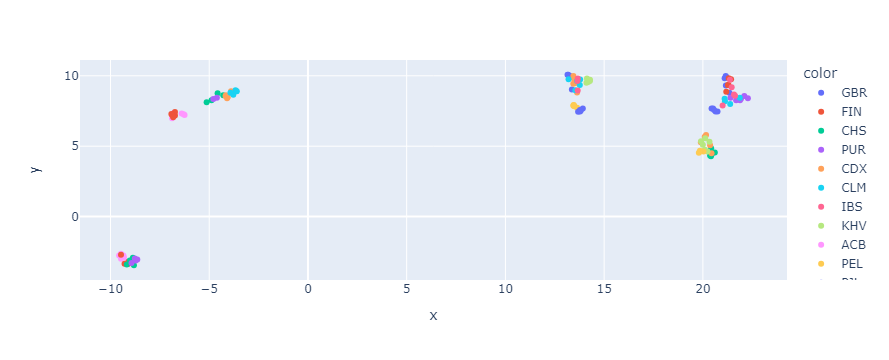

In [32]:
fig = px.scatter(x=umap_rot_input[:, 0], y=umap_rot_input[:, 1], color=rot_labels.to_list())
fig.show()

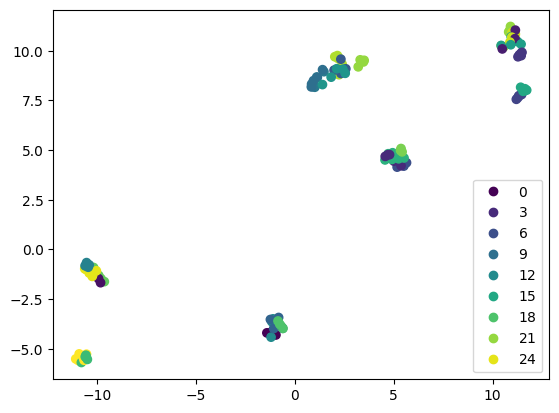

In [14]:
fig = plt.scatter(umap_rot_input[:, 0], umap_rot_input[:, 1], c=rot_labels.astype("category").cat.codes)
plt.legend(*fig.legend_elements(), loc="lower right")
plt.show()

In [9]:
tsne_3d_input = TSNE(n_components= 3, 
                        perplexity=30, 
                        learning_rate=200, 
                        early_exaggeration=12, 
                        n_iter=1000, 
                        init='pca').fit_transform(X)
tsne_3d_embeddings = TSNE(n_components= 3, 
                        perplexity=30, 
                        learning_rate=200, 
                        early_exaggeration=12, 
                        n_iter=1000, 
                        init='pca').fit_transform(embeddings)

In [55]:
ax_style = dict(
    showbackground =False,
    showaxeslabels=False,
    showticklabels=False,
    title=None,
    showgrid=False,
)

def draw_3d_scatter(mat3: pd.DataFrame, color, title: str, htmlname: str,
                    scatter_args=dict(color_discrete_sequence=px.colors.qualitative.Alphabet,   
                                     ),
                    legend={}
                    ):

    fig = px.scatter_3d(mat3, x=0, y=1, z=2,
        color=color, labels={'color': 'Population'}, 
                        # category_orders={'color': popname_to_code.keys()},
                        **scatter_args
                        
                        # color_discrete_map=popname_to_color,
                        # color_discrete_sequence=colors_all,
                        # size_max=3, 
                        # opacity=0.5
                       )
    fig.update_layout(height=700, title=title, 
                      scene=dict(xaxis=ax_style, yaxis=ax_style, zaxis=ax_style), # No bg
                     # margin=dict(l=0, r=0, b=0, t=0), # Tight layout
                    legend=legend | {'itemsizing': 'constant'},
                     )
    fig.update_traces(marker=dict(size=4))

    # Make minimalistic 3D axis lines
    fig.add_trace(go.Scatter3d(
        x=[0, 20],
        y=[0, 0],
        z=[0, 0],
        mode='lines',
        name='lines',
        showlegend=False,
        marker=dict(color="black"),
    ))
    fig.add_trace(go.Scatter3d(
        x=[0, 0],
        y=[0, 20],
        z=[0, 0],
        mode='lines',
        name='lines',
        showlegend=False,
        marker=dict(color="black"),
    ))
    fig.add_trace(go.Scatter3d(
        x=[0, 0],
        y=[0, 0],
        z=[0, 20],
        mode='lines',
        # name='lines',
        showlegend=False,
        marker=dict(color="black"),
    ))
    
    
    fig.show()
    fig.write_html(f"../Output/Analysis_Comparison/{htmlname}.html", full_html=True)


/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



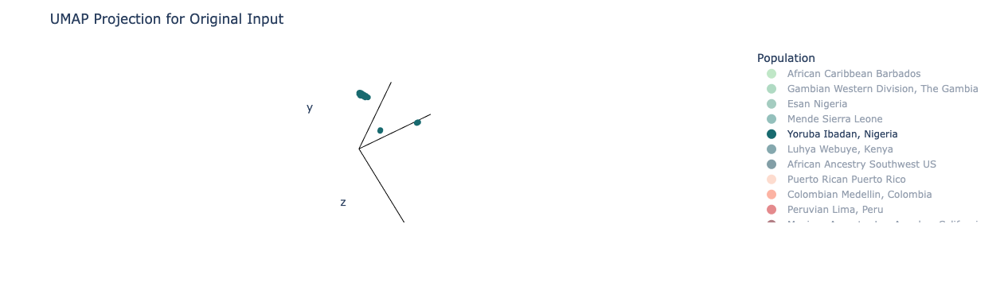

/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



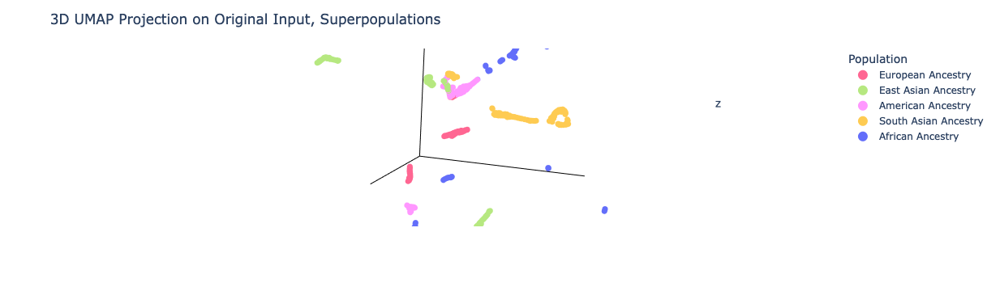

/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



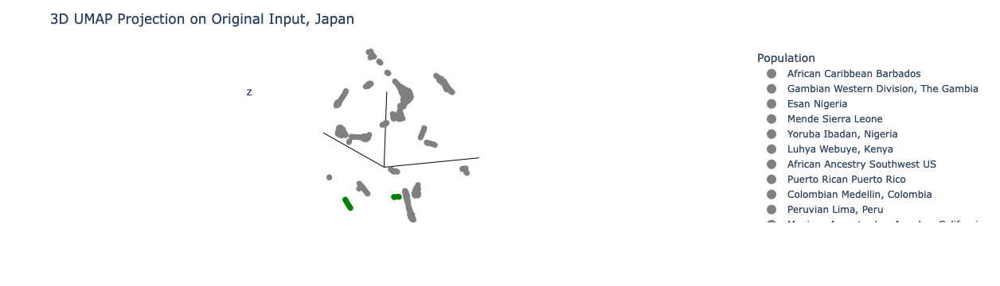

In [15]:
draw_3d_scatter(umap_3d_input, 
                color=label_names, 
                scatter_args=dict(color_discrete_map=popname_to_color),
                title="UMAP Projection for Original Input", 
                htmlname="umap3d_king_original")
draw_3d_scatter(umap_3d_input, 
                color=label_superpops, 
                title="3D UMAP Projection on Original Input, Superpopulations", 
                htmlname="umap3d_king_original_superpop",
               scatter_args=dict())
draw_3d_scatter(umap_3d_input, 
                color=label_names, 
                title="3D UMAP Projection on Original Input, Japan", 
                htmlname="umap3d_king_japan",
               scatter_args=dict(color_discrete_map = colors_only_jp))

/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



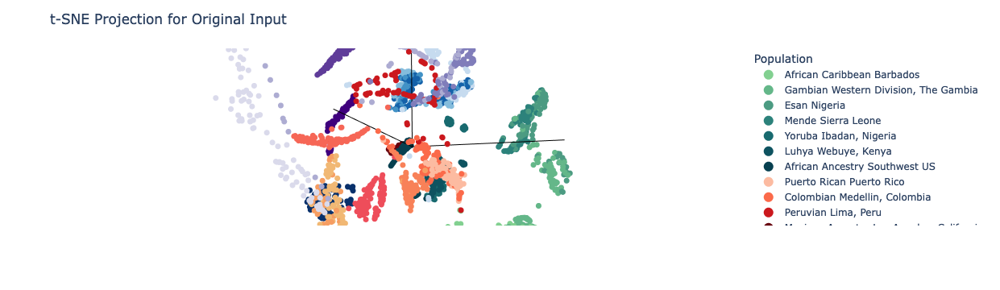

/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



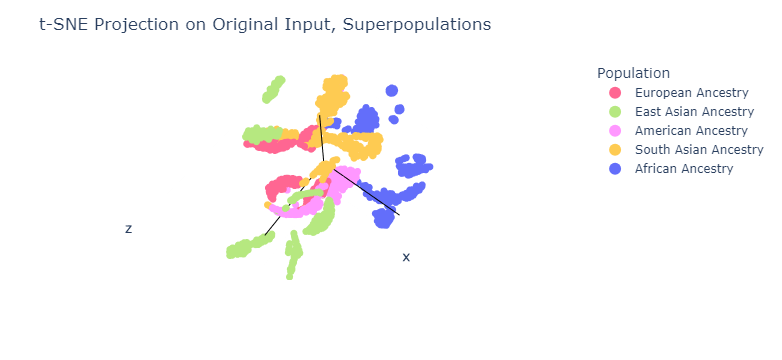

/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



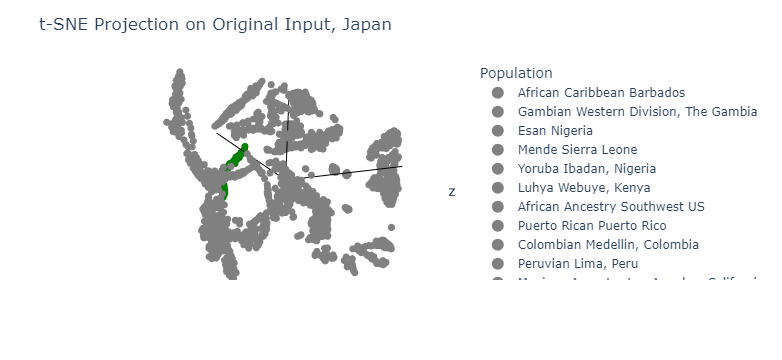

In [17]:
draw_3d_scatter(tsne_3d_input, 
                color=label_names, 
                scatter_args=dict(color_discrete_map=popname_to_color),
                title="t-SNE Projection for Original Input", 
                htmlname="tsne_king_original")
draw_3d_scatter(tsne_3d_input, 
                color=label_superpops, 
                title="t-SNE Projection on Original Input, Superpopulations", 
                htmlname="tsne_king_original_superpop",
               scatter_args=dict())
draw_3d_scatter(tsne_3d_input, 
                color=label_names, 
                title="t-SNE Projection on Original Input, Japan", 
                htmlname="tsne_king_japan",
               scatter_args=dict(color_discrete_map = colors_only_jp))

/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



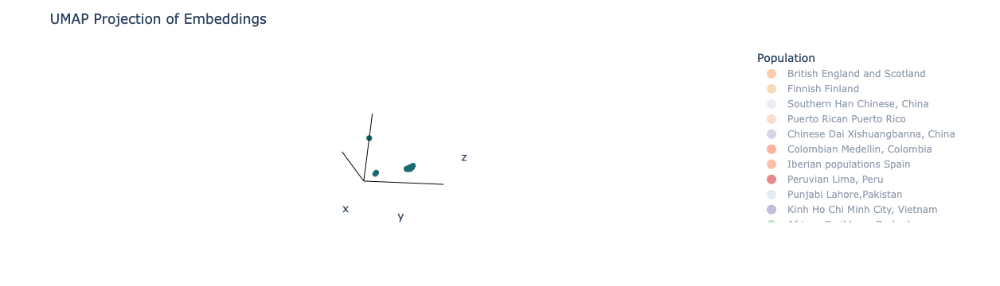

/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



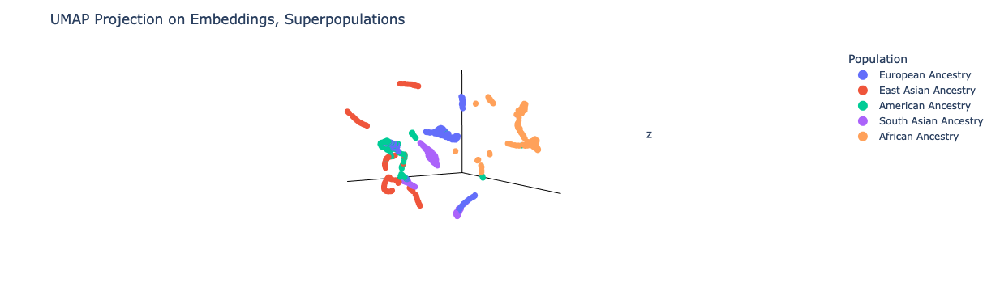

/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



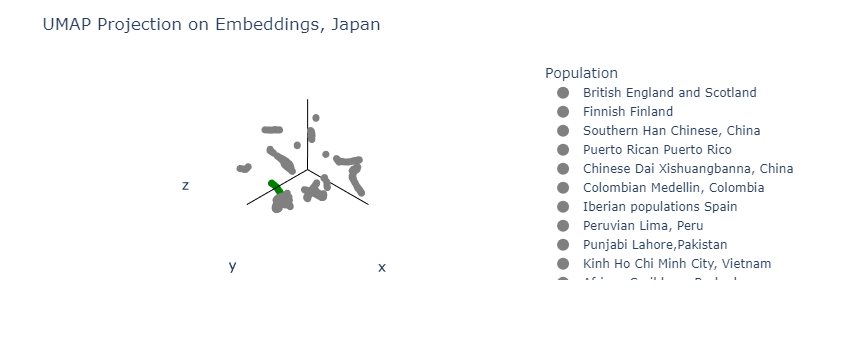

In [56]:
draw_3d_scatter(umap_3d_embeddings, 
                color=label_names, 
                scatter_args=dict(color_discrete_map=popname_to_color),
                title="UMAP Projection of Embeddings", 
                htmlname="umap_king_original")
draw_3d_scatter(umap_3d_embeddings, 
                color=label_superpops, 
                title="UMAP Projection on Embeddings, Superpopulations", 
                htmlname="umap_king_original_superpop",
               scatter_args=dict(color_discrete_sequence=px.colors.qualitative.Plotly)
               )
draw_3d_scatter(umap_3d_embeddings, 
                color=label_names, 
                title="UMAP Projection on Embeddings, Japan", 
                htmlname="umap_king_japan",
               scatter_args=dict(color_discrete_map = colors_only_jp))

## UMAP Reduce and Visualize Clustures

In [10]:
umap_params = {'min_dist': 0.0, 'n_neighbors': 22, 'target_weight': 1.0}
umap_2d = UMAP(n_components=2, **umap_params).fit_transform(X)
# umap_2d = UMAP(n_components=2).fit_transform(X)

/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



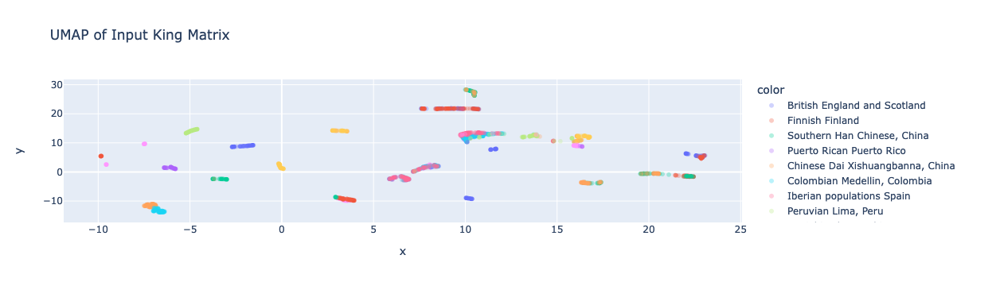

In [359]:
fig = px.scatter(x=umap_2d[:, 0], y=umap_2d[:, 1], color=label_names, opacity=0.3, title="UMAP of Input King Matrix")
fig.update_layout(height=700)
fig.show()

In [646]:
# umap_2d_filled = UMAP(n_components=2, **umap_params).fit_transform(X_filled)
umap_2d_filled = UMAP(n_components=2).fit_transform(X_filled)
# umap_2d = UMAP(n_components=2).fit_transform(X)

/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



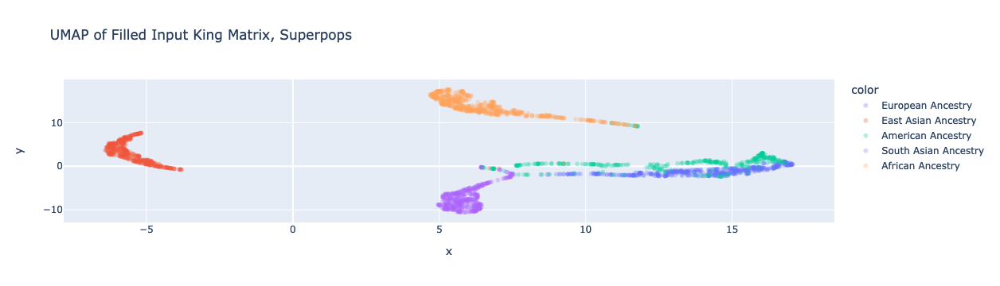

In [647]:
fig = px.scatter(x=umap_2d_filled[:, 0], y=umap_2d_filled[:, 1], color=label_superpops, opacity=0.3, title="UMAP of Filled Input King Matrix, Superpops")
fig.update_layout(height=700)
fig.show()

/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



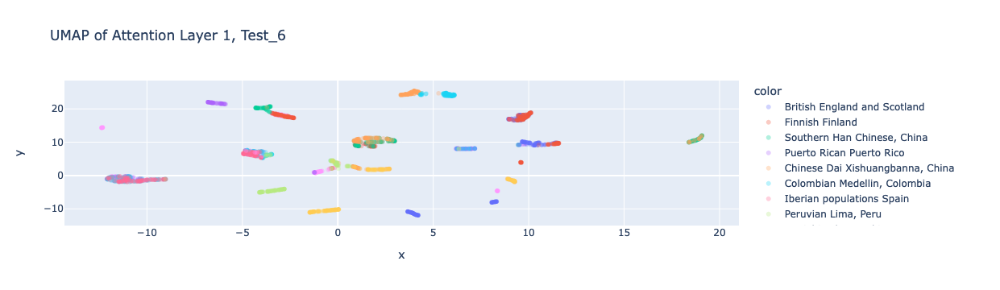

/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



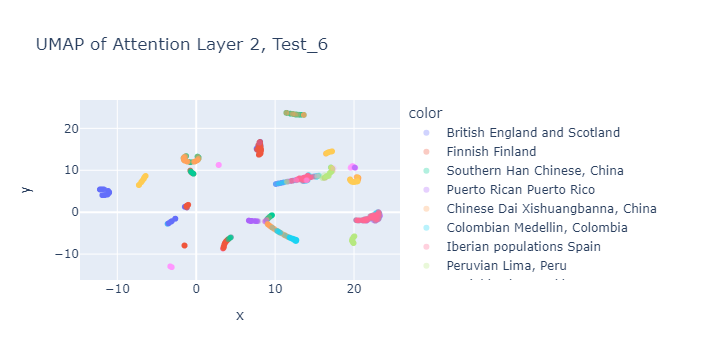

/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



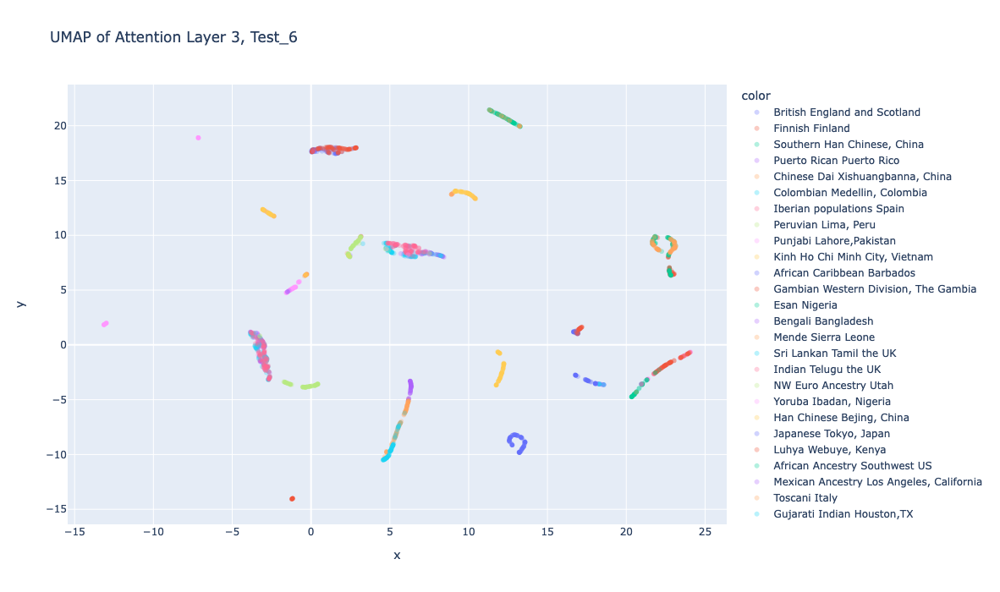

/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



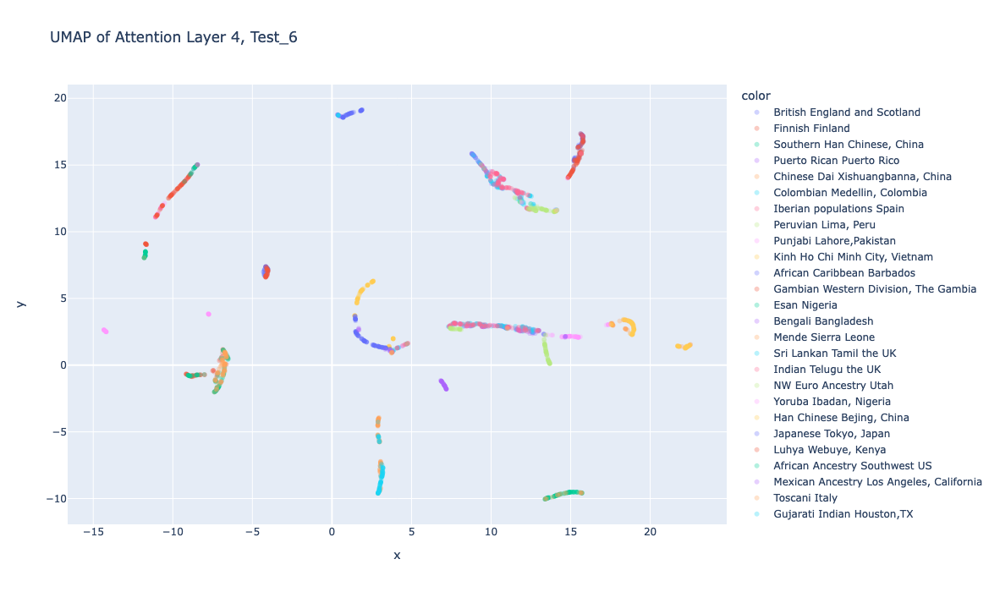

/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



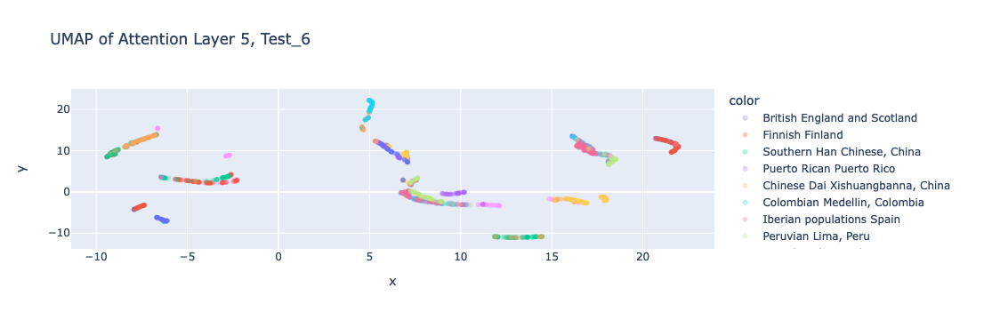

/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



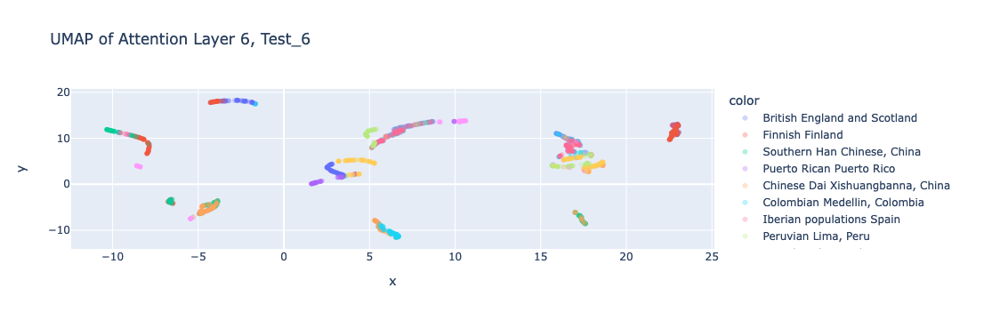

In [655]:
t6_data = np.load("../Output/Runs/test6/Test_6_attention_maps_embeddings.npy", allow_pickle=True).item()

for i in range(1, 7):
    umap = UMAP(n_components=2, **umap_params).fit_transform(t6_data[i])
    fig = px.scatter(x=umap[:, 0], y=umap[:, 1], color=label_names, opacity=0.3, title=f"UMAP of Attention Layer {i}, Test_6")
    fig.update_layout(height=700)
    fig.show()

/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



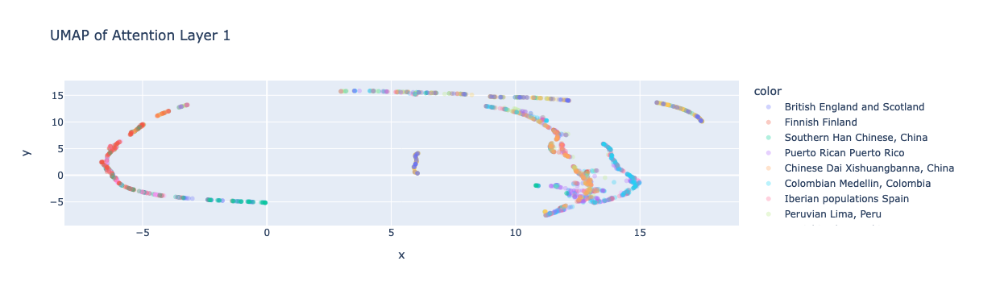

/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



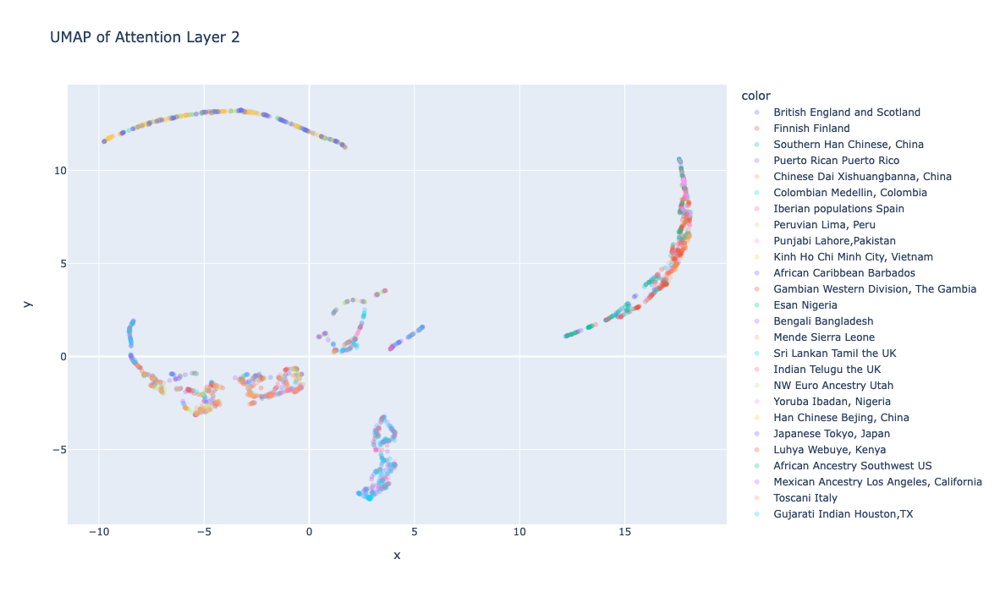

/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



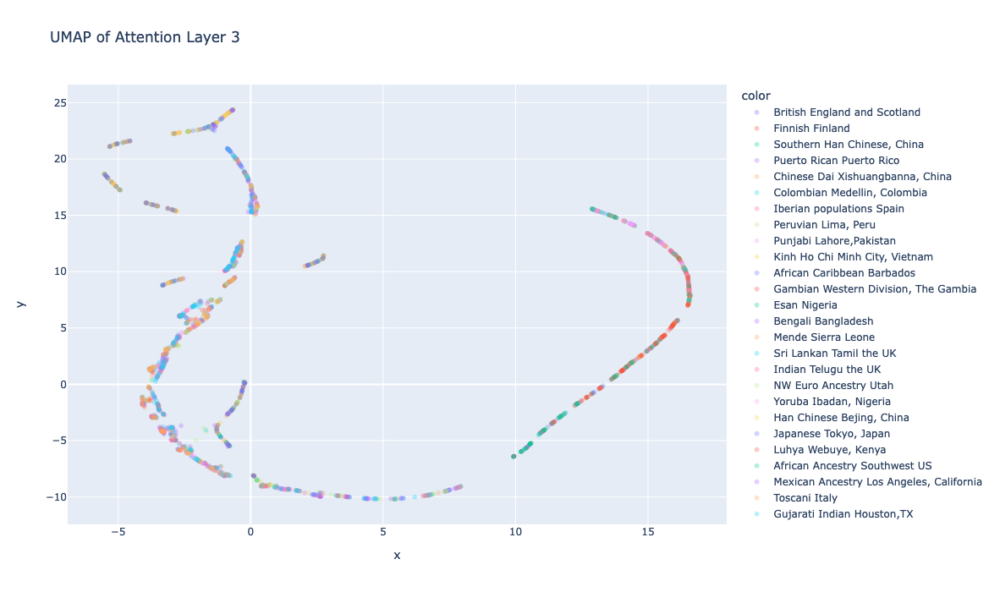

/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



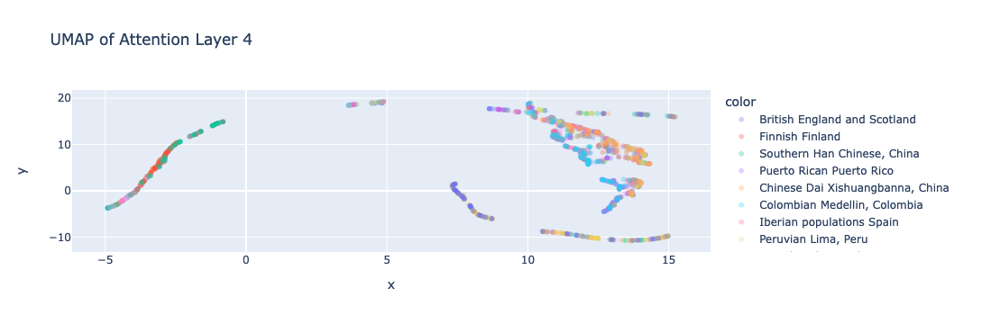

/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



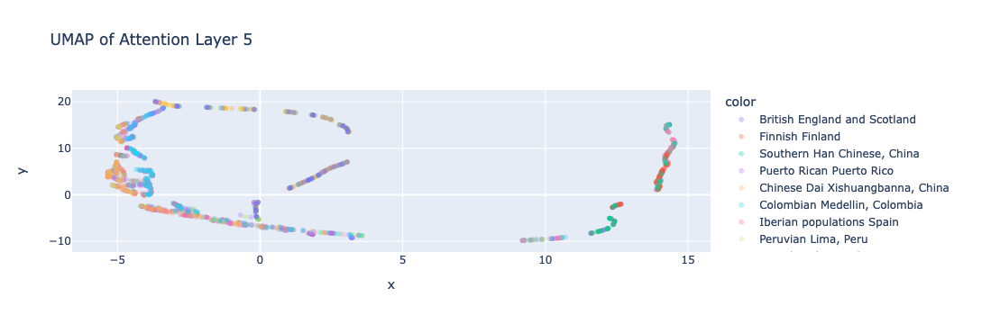

/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



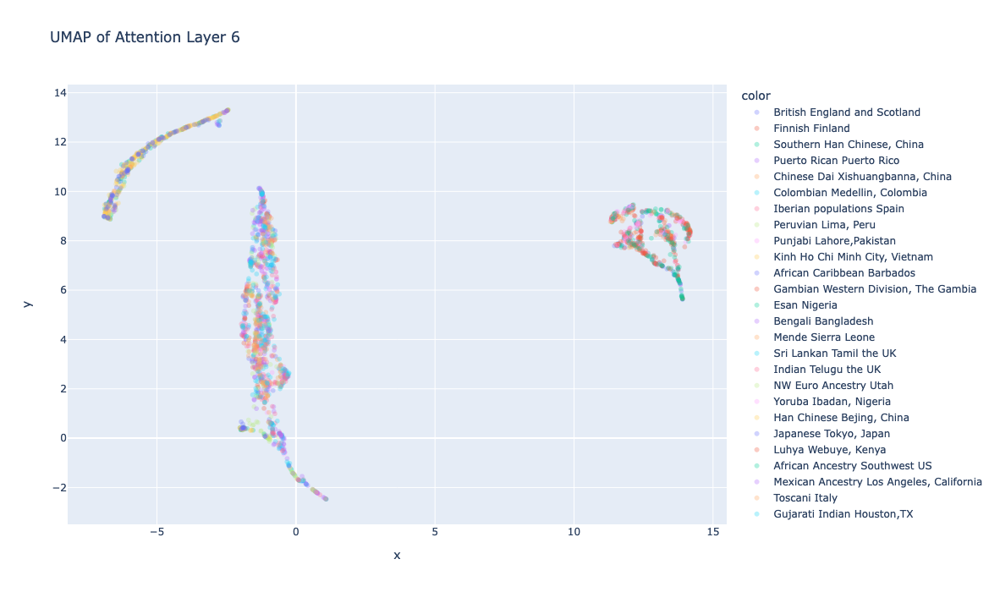

In [654]:
t11_data = np.load("../Output/Runs/test9/Test_11_fmat_1h_attention_maps_embeddings.npy", allow_pickle=True).item()

for i in range(1, 7):
    umap = UMAP(n_components=2, **umap_params).fit_transform(t11_data[i])
    fig = px.scatter(x=umap[:, 0], y=umap[:, 1], color=label_names, opacity=0.3, title=f"UMAP of Attention Layer {i}")
    fig.update_layout(height=700)
    fig.show()

In [695]:
umap_embeddings = UMAP(n_components=2, **umap_params).fit_transform(embeddings)

/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:259: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



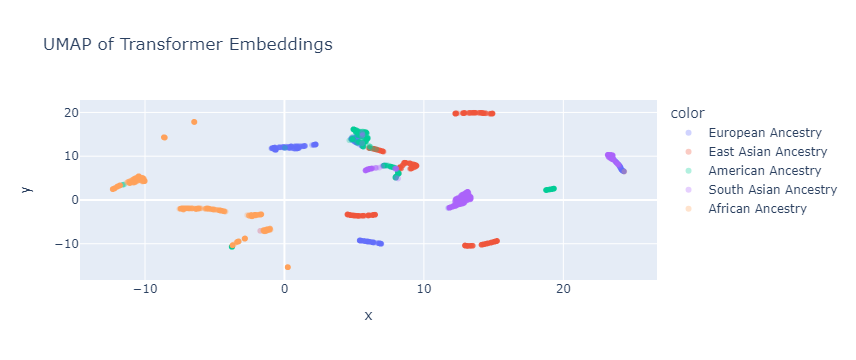

In [696]:
fig = px.scatter(x=umap_embeddings[:, 0], y=umap_embeddings[:, 1], color=label_superpops, opacity=0.3, title="UMAP of Transformer Embeddings")
fig.update_layout(height=700)
fig.show()

/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



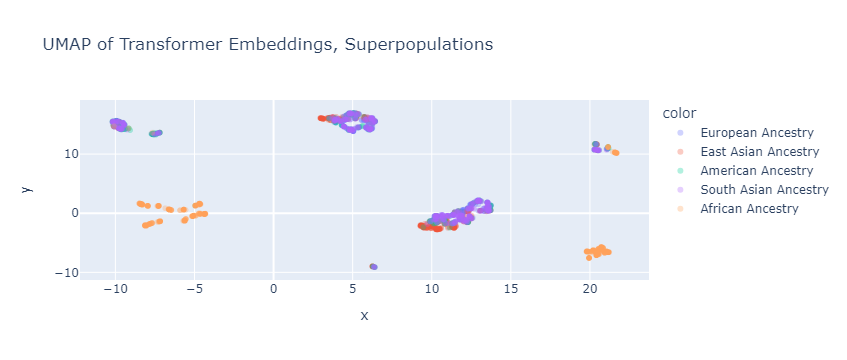

In [694]:
fig = px.scatter(x=umap_embeddings[:, 0], y=umap_embeddings[:, 1], color=label_superpops, opacity=0.3, title="UMAP of Transformer Embeddings, Superpopulations")
fig.update_layout(height=700)
fig.show()

In [629]:
umap_na = UMAP(n_components=2, **umap_params).fit_transform(na_df)
pca_na = PCA(n_components=2).fit_transform(na_df)

/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:259: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



NameError: name 'PCA' is not defined

/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



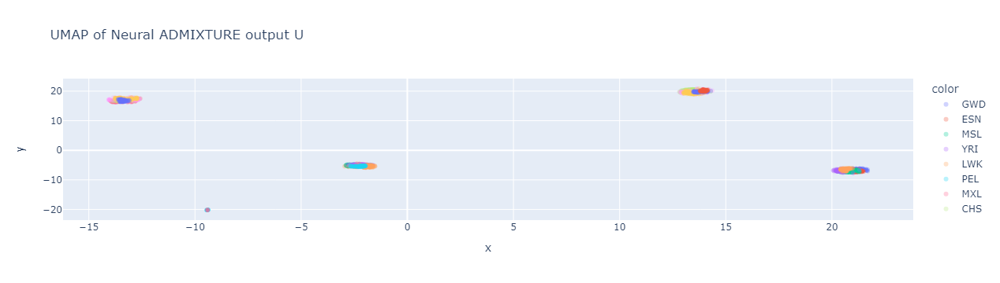

In [630]:
fig = px.scatter(x=umap_na[:, 0], y=umap_na[:, 1], color=na_label_codes[1], opacity=0.3, title="UMAP of Neural ADMIXTURE output U*F")
fig.update_layout(height=700)
fig.show()

/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



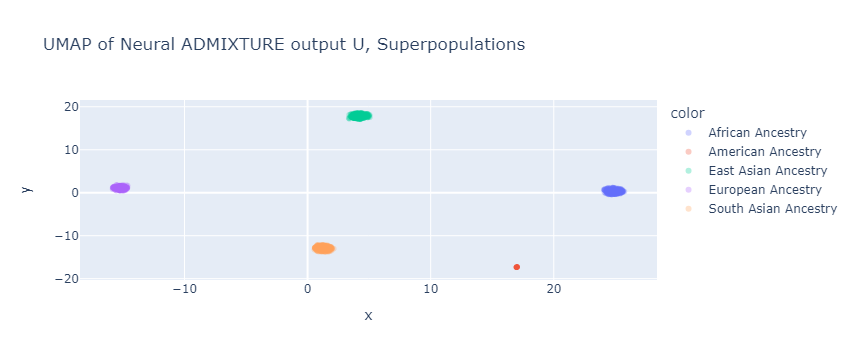

In [555]:
fig = px.scatter(x=umap_na[:, 0], y=umap_na[:, 1], color=na_label_superpops, opacity=0.3, title="UMAP of Neural ADMIXTURE output U, Superpopulations")
fig.update_layout(height=700)
fig.show()

### Cluster/Segment UMAP regions

In [11]:
clust_labels = DBSCAN(min_samples=1).fit(umap_3d_input)

In [12]:
np.max(clust_labels.labels_)

29

In [17]:
len(label_names.unique())

26

In [18]:
label_codes

,0
0,GBR
1,GBR
2,GBR
3,GBR
4,GBR
...,...
2498,GIH
2499,GIH
2500,GIH
2501,GIH


In [13]:
clust_labels_embeddings = DBSCAN(min_samples=1).fit(umap_3d_embeddings)
print(np.min(clust_labels_embeddings.labels_), np.max(clust_labels_embeddings.labels_))

0 27


In [14]:
clust_labels_na = DBSCAN().fit(umap_na)
np.max(clust_labels_na.labels_)

NameError: name 'umap_na' is not defined

## Cluster Comparison

### Metrics

In [21]:
def cluster_metrics(y, pred, name):
    # https://scikit-learn.org/stable/modules/clustering.html#clustering-performance-evaluation 
    return {
        "Method": name,
        # function that measures the similarity of the two assignments
        "Rand": rand_score(y, pred),
        # corrects for chance, 0 is completely random
        "Adjusted Rand": adjusted_rand_score(y, pred),
        # 0 - 1.0 all members of a given class are assigned to the same cluster
        "Completeness": completeness_score(y, pred),
        # Mutual information, a non-negative value, measured in nats using the natural logarithm
        # measure of the similarity between two labels of the same data
        "Mutual Info (MI)": mutual_info_score(y, pred),
        # Score between 0.0 and 1.0 in normalized nats (based on the natural logarithm). 1.0 stands for perfectly complete labeling.
        # Equivalent to v-measure score
        "NMI": normalized_mutual_info_score(y, pred),
        # The AMI returns a value of 1 when the two partitions are identical (ie perfectly matched) 0 when random
        "AMI": adjusted_mutual_info_score(y, pred)
        }

In [22]:
cluster_metrics(y, clust_labels.labels_, "UMAP 2D")

{'Method': 'UMAP 2D',
 'Rand': 0.9578098607809717,
 'Adjusted Rand': 0.5358142750792472,
 'Completeness': 0.8277609183032926,
 'Mutual Info (MI)': 2.538151351080405,
 'NMI': 0.8037160438344471,
 'AMI': 0.7937729513424986}

In [23]:
cluster_metrics(y, clust_labels_embeddings.labels_, "UMAP Transformer Embeddings")

{'Method': 'UMAP Transformer Embeddings',
 'Rand': 0.9557033558131521,
 'Adjusted Rand': 0.5241163277661596,
 'Completeness': 0.8251623359662755,
 'Mutual Info (MI)': 2.515260384722877,
 'NMI': 0.7987546214298196,
 'AMI': 0.7888110385738492}

In [584]:
cluster_metrics(na_y.flatten(), clust_labels_na.labels_, "UMAP NeuralADMIXTURE")

{'Method': 'UMAP NeuralADMIXTURE',
 'Rand': 0.807910664325854,
 'Adjusted Rand': 0.28583394824129976,
 'Completeness': 1.0000000000000002,
 'Mutual Info (MI)': 1.447743353688278,
 'NMI': 0.6531156784896199,
 'AMI': 0.6497002053044966}

### Compare clusters labels by alignmnent

In [24]:
def align_clusts(truelabs, clusts: list[np.ndarray]):
    clust_max_labs = []
    new_clust_inds = [dict() for i in clusts]
    new_clusts = []
    
    # Find max y (true label) val for each cluster for each assignment list, along with clust size
    for c in clusts:
        maxlabs = []
        for i in range(np.max(c) + 1):
            maxlabs.append((i, np.max(truelabs[np.where(c == i)]), len(np.where(c == i)[0])))
        clust_max_labs.append(maxlabs)

    # Sort clusters by max y, then by size
    for i, c in enumerate(clust_max_labs):
        clust_max_labs[i] = sorted(c, key=lambda x: (x[1], -x[2]))

    # Align by max y val, allowing for empty clusts
    curr_inds = np.zeros(len(clusts), dtype=int)
    newind = 0
    # Keep going until all clusts inds from all lists considered
    while not np.all([len(c) for c in clust_max_labs] <= curr_inds):
        curr_truelab = np.min([clust_max_labs[i][x][1] for i, x in enumerate(curr_inds) if x < len(clust_max_labs[i])])
        for i, x in enumerate(curr_inds):
            if x < len(clust_max_labs[i]) and curr_truelab == clust_max_labs[i][x][1]:
                new_clust_inds[i][clust_max_labs[i][x][0]] = newind
                curr_inds[i] = x + 1
        newind += 1

    # Replace original cluster assignments with new aligned ones
    for i, clust in enumerate(clusts):
        new_clusts.append(np.array([new_clust_inds[i][x] for x in clust]))
        
    return new_clusts

In [115]:
label_names.str.replace("\n", " - ")[np.argmax(y == 3)]

'Chinese Dai - Xishuangbanna, China'

In [121]:
def compare_clusts(truelabs, clusts1: np.ndarray, clusts2: np.ndarray, labcodes_to_names):
    maxlab = np.max(truelabs) + 1

    deets = []

    # Go over each labeled cluster in both lists
    for i in range(np.max([clusts1, clusts2]) + 1):
        current = {}
        deets.append(current)
        
        c1 = np.unique(truelabs[np.where(clusts1 == i)], return_counts=True)
        c2 = np.unique(truelabs[np.where(clusts2 == i)], return_counts=True)

        # Ignore new clusters
        if c1[0].size <= 0:
            current["Embedding Pop Desc"] = ", ".join([f"{(c2[1][j]/np.sum(c2[1])):.0%} {labcodes_to_names[np.argmax(truelabs == c2[0][j])]}" for j in range(len(c2[0]))])
            current["Embedding Size"] = np.sum(c2[1])
            current["Similarity"] = 0
            continue
        elif c2[0].size <= 0:
            current["Pop Desc"] = ", ".join([f"{(c1[1][j]/np.sum(c1[1])):.0%} {labcodes_to_names[np.argmax(truelabs == c1[0][j])]}" for j in range(len(c1[0]))])
            current["Size"] = np.sum(c1[1])
            current["Similarity"] = 0
            continue

        current["Pop Desc"] = ", ".join([f"{(c1[1][j]/np.sum(c1[1])):.0%} {labcodes_to_names[np.argmax(truelabs == c1[0][j])]}" for j in range(len(c1[0]))])
        current["Size"] = np.sum(c1[1])
        current["Embedding Pop Desc"] = ", ".join([f"{(c2[1][j]/np.sum(c2[1])):.0%} {labcodes_to_names[np.argmax(truelabs == c2[0][j])]}" for j in range(len(c2[0]))])
        current["Embedding Size"] = np.sum(c2[1])

        c1_arr, c2_arr = np.zeros(maxlab), np.zeros(maxlab)
        np.put(c1_arr, *c1)
        np.put(c2_arr, *c2)

        sim = 1 - np.sum(np.abs(c1_arr - c2_arr)) / (np.count_nonzero(clusts1 == i) + np.count_nonzero(clusts2 == i))
        current["Similarity"] = sim

        print(f"Similarity: {sim}")
        
        print(f"{i}\tClustering 1: len {len(truelabs[np.where(clusts1 == i)])}\tClustering 2: len {len(truelabs[np.where(clusts2 == i)])}")


    return deets

In [26]:
clust_labels_embeddings.labels_

array([ 0,  0,  0, ..., 27, 27, 27], dtype=int64)

In [27]:
align_clusts(y, [clust_labels.labels_, clust_labels_embeddings.labels_])

[array([24, 24, 24, ..., 29, 29, 29]), array([24, 24, 24, ..., 29, 29, 29])]

In [28]:
newclusts = align_clusts(y, [clust_labels.labels_, clust_labels_embeddings.labels_])

In [2]:
label_codes

NameError: name 'label_codes' is not defined

In [138]:
# deets = compare_clusts(y, newclusts[0], newclusts[1], label_names.str.replace("\n", " - "))
deets = compare_clusts(y, newclusts[0], newclusts[1], label_codes["0"])
deets

Similarity: 1.0
0	Clustering 1: len 22	Clustering 2: len 22
Similarity: 1.0
4	Clustering 1: len 98	Clustering 2: len 98
Similarity: 1.0
5	Clustering 1: len 103	Clustering 2: len 103
Similarity: 0.8888888888888888
6	Clustering 1: len 120	Clustering 2: len 96
Similarity: 1.0
8	Clustering 1: len 79	Clustering 2: len 79
Similarity: 0.9928057553956835
10	Clustering 1: len 70	Clustering 2: len 69
Similarity: 0.9855072463768116
11	Clustering 1: len 34	Clustering 2: len 35
Similarity: 0.9375
12	Clustering 1: len 75	Clustering 2: len 85
Similarity: 0.5287356321839081
13	Clustering 1: len 60	Clustering 2: len 27
Similarity: 1.0
14	Clustering 1: len 18	Clustering 2: len 18
Similarity: 0.5914396887159533
15	Clustering 1: len 158	Clustering 2: len 99
Similarity: 0.8072289156626506
16	Clustering 1: len 84	Clustering 2: len 82
Similarity: 0.976
18	Clustering 1: len 64	Clustering 2: len 61
Similarity: 0.4126984126984127
19	Clustering 1: len 63	Clustering 2: len 63
Similarity: 0.3555555555555555
20	Clu

[{'Pop Desc': '100% ACB',
  'Size': 22,
  'Embedding Pop Desc': '100% ACB',
  'Embedding Size': 22,
  'Similarity': 1.0},
 {'Pop Desc': '100% ACB', 'Size': 21, 'Similarity': 0},
 {'Pop Desc': '100% ACB', 'Size': 12, 'Similarity': 0},
 {'Pop Desc': '100% CDX', 'Size': 1, 'Similarity': 0},
 {'Pop Desc': '100% CEU',
  'Size': 98,
  'Embedding Pop Desc': '100% CEU',
  'Embedding Size': 98,
  'Similarity': 1.0},
 {'Pop Desc': '100% CHB',
  'Size': 103,
  'Embedding Pop Desc': '100% CHB',
  'Embedding Size': 103,
  'Similarity': 1.0},
 {'Pop Desc': '12% CDX, 88% CHS',
  'Size': 120,
  'Embedding Pop Desc': '12% CDX, 88% CHS',
  'Embedding Size': 96,
  'Similarity': 0.8888888888888888},
 {'Embedding Pop Desc': '12% CDX, 88% CHS',
  'Embedding Size': 24,
  'Similarity': 0},
 {'Pop Desc': '49% ACB, 51% GWD',
  'Size': 79,
  'Embedding Pop Desc': '49% ACB, 51% GWD',
  'Embedding Size': 79,
  'Similarity': 1.0},
 {'Embedding Pop Desc': '47% CLM, 53% IBS',
  'Embedding Size': 15,
  'Similarity': 0

In [192]:
ctable_df = pd.DataFrame(deets).fillna(0).astype({"Size": int, "Embedding Size": int})
# ctable_df = ctable_df[["Pop Desc"]]
ctable_df = ctable_df.sort_values(["Similarity", "Size", "Embedding Size"], ascending=False)
print(ctable_df.fillna("").to_markdown(index=False))
ctable_df

| Pop Desc                                                  |   Size | Embedding Pop Desc                                |   Embedding Size |   Similarity |
|:----------------------------------------------------------|-------:|:--------------------------------------------------|-----------------:|-------------:|
| 53% FIN, 46% GBR, 1% PUR                                  |    186 | 53% FIN, 46% GBR, 1% PUR                          |              186 |    1         |
| 6% ASW, 54% LWK, 40% YRI                                  |    150 | 6% ASW, 54% LWK, 40% YRI                          |              150 |    1         |
| 100% CHB                                                  |    103 | 100% CHB                                          |              103 |    1         |
| 100% CEU                                                  |     98 | 100% CEU                                          |               98 |    1         |
| 49% ACB, 51% GWD                                        

,Pop Desc,Size,Embedding Pop Desc,Embedding Size,Similarity
24,"53% FIN, 46% GBR, 1% PUR",186,"53% FIN, 46% GBR, 1% PUR",186,1.000000
31,"6% ASW, 54% LWK, 40% YRI",150,"6% ASW, 54% LWK, 40% YRI",150,1.000000
5,100% CHB,103,100% CHB,103,1.000000
4,100% CEU,98,100% CEU,98,1.000000
8,"49% ACB, 51% GWD",79,"49% ACB, 51% GWD",79,1.000000
32,100% YRI,29,100% YRI,29,1.000000
0,100% ACB,22,100% ACB,22,1.000000
33,100% YRI,19,100% YRI,19,1.000000
14,100% LWK,18,100% LWK,18,1.000000
29,"49% GIH, 51% TSI",208,"0% ASW, 49% GIH, 50% TSI",208,0.995192


In [168]:
## Make code to name table for paper
code_table = sample_to_popcode.iloc[:, 1:].drop_duplicates()
code_table = code_table[code_table["Population code"].isin(popname_to_code.values()) &\
                           ~code_table["Superpopulation name"].str.contains(",") ]\
                .sort_values("Superpopulation name")\
                .reset_index()
code_table["Population name"] = code_table["Population code"].map(dict(zip(popname_to_code.values(), popname_to_code.keys())))\
                                                            .str.replace("\n", " - ")
code_table["Superpopulation name"] = code_table["Superpopulation name"].str.replace("Ancestry", "")
code_table = code_table[["Population code", "Population name", "Superpopulation code", "Superpopulation name"]]
print(code_table.fillna("").to_markdown(index=False))
code_table

| Population code   | Population name                            | Superpopulation code   | Superpopulation name   |
|:------------------|:-------------------------------------------|:-----------------------|:-----------------------|
| ESN               | Esan - Nigeria                             | AFR                    | African                |
| ASW               | African Ancestry - Southwest US            | AFR                    | African                |
| MSL               | Mende - Sierra Leone                       | AFR                    | African                |
| GWD               | Gambian - Western Division, The Gambia     | AFR                    | African                |
| ACB               | African Caribbean - Barbados               | AFR                    | African                |
| LWK               | Luhya - Webuye, Kenya                      | AFR                    | African                |
| YRI               | Yoruba - Ibadan, Nigeria                  

,Population code,Population name,Superpopulation code,Superpopulation name
0,ESN,Esan - Nigeria,AFR,African
1,ASW,African Ancestry - Southwest US,AFR,African
2,MSL,Mende - Sierra Leone,AFR,African
3,GWD,"Gambian - Western Division, The Gambia",AFR,African
4,ACB,African Caribbean - Barbados,AFR,African
5,LWK,"Luhya - Webuye, Kenya",AFR,African
6,YRI,"Yoruba - Ibadan, Nigeria",AFR,African
7,PEL,"Peruvian - Lima, Peru",AMR,American
8,MXL,"Mexican Ancestry - Los Angeles, California",AMR,American
9,CLM,"Colombian - Medellin, Colombia",AMR,American


In [123]:
clust_df = pd.DataFrame((newclusts + [label_names])).T
clust_df.columns = ["Original Clusts", "Transformer Embedding Clusts", "Population"]
clust_df = pd.melt(clust_df, 
        value_vars=["Original Clusts", "Transformer Embedding Clusts"], \
        id_vars=["Population"], 
        var_name="Source UMAP", 
        value_name="Cluster")
clust_df["Cluster"] = clust_df["Cluster"].astype(int)

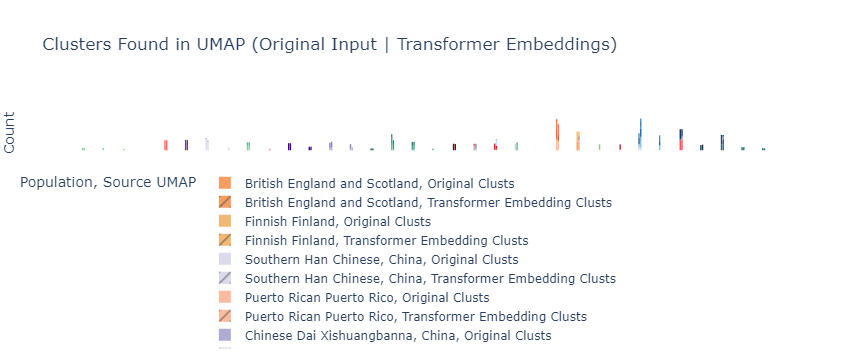

In [99]:
fig = px.histogram(clust_df, 
             # x="Cluster", 
             x="Source UMAP", 
             color="Population", 
             # orientation="h",
             facet_col="Cluster",
             category_orders={"Cluster": [i for i in range(clust_df["Cluster"].max() + 1)]},
             # facet_col_wrap=3,
             title="Clusters Found in UMAP (Original Input | Transformer Embeddings)",
             pattern_shape="Source UMAP",
                   color_discrete_map=popname_to_color,
                   # color_discrete_sequence=px.colors.qualitative.Alphabet
                    # category_orders={'color': popname_to_code.keys()}
                  )

# # To modify the gaps between subplots, you can modify the domain of their xaxis
# def domains_calculator(gap, n_plot):
#     """
#     little helper to calculate the range of subplots domains
#     """
#     plot_width = (1 - (n_plot-1) * gap) / n_plot
#     return [
#         [i * (plot_width + gap), i * (plot_width + gap) + plot_width]
#         for i in range(n_plot)
#     ]

# nplot = clust_df["Cluster"].max() + 1
# domains = domains_calculator(gap=0.005, n_plot=nplot)

# for i in range(nplot):
#     fig.update_xaxes(domain=domains[i], row=1, col=i+1)
    

# little customisations
fig.for_each_annotation(lambda a: a.update(text=''))# remove the facet titles
fig.update_layout(
    plot_bgcolor='rgba(0,0,0,0)', 
                  yaxis_title="Count", 
                  yaxis_showticklabels=False, 
                  legend=dict(
                        yanchor="top",
                        y=-2.9,
                        xanchor="left",
                        x=0.01,
                        orientation="h",
                      
                    ),
                  # width=1200,
                    height=700,
                    hovermode="x",
    # xaxis_showgrid=False,
    # yaxis_showgrid=False,
                 )
# fig.update_xaxes(title="Original Input | Transformer Embeddings")
fig.update_xaxes(visible=False, showgrid=False)
# fig.update_yaxes(
#     # visible=False, 
#                  showgrid=False)
fig.update_layout()




# fig.show(renderer="png")
fig.show()

In [174]:
label_superpops.map(dict(zip(superpop_to_name.values(), superpop_to_name.keys())))

0       EUR
1       EUR
2       EUR
3       EUR
4       EUR
       ... 
2498    SAS
2499    SAS
2500    SAS
2501    SAS
2502    SAS
Name: 0, Length: 2503, dtype: object

In [175]:
newclusts_superpops = align_clusts(label_superpops_y.to_numpy(), [clust_labels.labels_, clust_labels_embeddings.labels_])

deets_super = compare_clusts(label_superpops_y.to_numpy(), newclusts_superpops[0], newclusts_superpops[1], label_superpops.map(dict(zip(superpop_to_name.values(), superpop_to_name.keys()))))

clust_super_df = pd.DataFrame((newclusts_superpops + [label_superpops])).T
clust_super_df.columns = ["Original Clusts", "Transformer Embedding Clusts", "Population"]
clust_super_df = pd.melt(clust_super_df, 
        value_vars=["Original Clusts", "Transformer Embedding Clusts"], \
        id_vars=["Population"], 
        var_name="Source UMAP", 
        value_name="Cluster")
clust_super_df["Cluster"] = clust_super_df["Cluster"].astype(int)

Similarity: 0.974025974025974
0	Clustering 1: len 158	Clustering 2: len 150
Similarity: 0.7951807228915663
1	Clustering 1: len 150	Clustering 2: len 99
Similarity: 0.9879518072289156
2	Clustering 1: len 84	Clustering 2: len 82
Similarity: 1.0
3	Clustering 1: len 79	Clustering 2: len 79
Similarity: 1.0
4	Clustering 1: len 29	Clustering 2: len 29
Similarity: 1.0
5	Clustering 1: len 22	Clustering 2: len 22
Similarity: 0.95
6	Clustering 1: len 21	Clustering 2: len 19
Similarity: 0.972972972972973
7	Clustering 1: len 19	Clustering 2: len 18
Similarity: 0.976
11	Clustering 1: len 64	Clustering 2: len 61
Similarity: 0.9237668161434978
13	Clustering 1: len 120	Clustering 2: len 103
Similarity: 0.964824120603015
14	Clustering 1: len 103	Clustering 2: len 96
Similarity: 0.9375
15	Clustering 1: len 75	Clustering 2: len 85
Similarity: 0.9928057553956835
16	Clustering 1: len 70	Clustering 2: len 69
Similarity: 0.975609756097561
17	Clustering 1: len 60	Clustering 2: len 63
Similarity: 0.985507246376

In [193]:
ctable_super_df = pd.DataFrame(deets_super).fillna(0).astype({"Size": int, "Embedding Size": int})
# ctable_df = ctable_df[["Pop Desc"]]
ctable_super_df = ctable_super_df.sort_values(["Similarity", "Size", "Embedding Size"], ascending=False)
print(ctable_super_df.fillna("").to_markdown(index=False, floatfmt=".3f", intfmt=","))
ctable_super_df


| Pop Desc                         |   Size | Embedding Pop Desc        |   Embedding Size |   Similarity |
|:---------------------------------|-------:|:--------------------------|-----------------:|-------------:|
| 1% AMR, 99% EUR                  |    186 | 1% AMR, 99% EUR           |              186 |        1.000 |
| 100% EUR                         |     98 | 100% EUR                  |               98 |        1.000 |
| 100% AFR                         |     79 | 100% AFR                  |               79 |        1.000 |
| 100% AFR                         |     29 | 100% AFR                  |               29 |        1.000 |
| 100% AFR                         |     22 | 100% AFR                  |               22 |        1.000 |
| 100% EAS                         |     70 | 100% EAS                  |               69 |        0.993 |
| 100% AFR                         |     84 | 100% AFR                  |               82 |        0.988 |
| 100% EAS                  

,Pop Desc,Size,Embedding Pop Desc,Embedding Size,Similarity
21,"1% AMR, 99% EUR",186,"1% AMR, 99% EUR",186,1.000000
22,100% EUR,98,100% EUR,98,1.000000
3,100% AFR,79,100% AFR,79,1.000000
4,100% AFR,29,100% AFR,29,1.000000
5,100% AFR,22,100% AFR,22,1.000000
16,100% EAS,70,100% EAS,69,0.992806
2,100% AFR,84,100% AFR,82,0.987952
18,100% EAS,34,100% EAS,35,0.985507
11,100% AMR,64,100% AMR,61,0.976000
17,100% EAS,60,"5% AMR, 95% EAS",63,0.975610


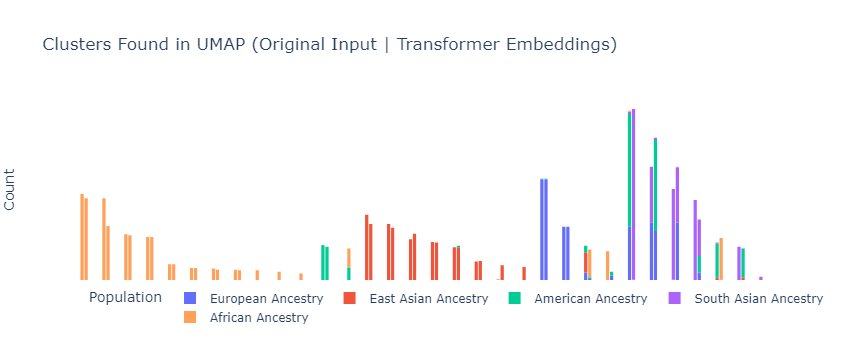

In [106]:
fig = px.histogram(clust_super_df, 
             # x="Cluster", 
             x="Source UMAP", 
             color="Population", 
             # orientation="h",
             facet_col="Cluster",
             category_orders={"Cluster": [i for i in range(clust_super_df["Cluster"].max() + 1)]},
             # facet_col_wrap=3,
             title="Clusters Found in UMAP (Original Input | Transformer Embeddings)",
                   # color_discrete_map={"European Ancestry": "blue"},
             # pattern_shape="Source UMAP",
                  )

# To modify the gaps between subplots, you can modify the domain of their xaxis
# def domains_calculator(gap, n_plot):
#     """
#     little helper to calculate the range of subplots domains
#     """
#     plot_width = (1 - (n_plot-1) * gap) / n_plot
#     return [
#         [i * (plot_width + gap), i * (plot_width + gap) + plot_width]
#         for i in range(n_plot)
#     ]

# nplot = clust_super_df["Cluster"].max() + 1
# domains = domains_calculator(gap=0.005, n_plot=nplot)

# for i in range(nplot):
#     fig.update_xaxes(domain=domains[i], row=1, col=i+1)
    

# little customisations
fig.for_each_annotation(lambda a: a.update(text=''))# remove the facet titles
fig.update_layout(
    plot_bgcolor='rgba(0,0,0,0)', 
                  yaxis_title="Count", 
                  yaxis_showticklabels=False, 
                  legend=dict(
                        yanchor="top",
                        y=-2.9,
                        xanchor="left",
                        x=0.01,
                        orientation="h",
                      
                    ),
                  # width=1200,
                    height=600,
                    hovermode="x",
    # xaxis_showgrid=False,
    # yaxis_showgrid=False,
                 )
# fig.update_xaxes(title="Original Input | Transformer Embeddings")
fig.update_xaxes(visible=False, showgrid=False)
# fig.update_yaxes(visible=False, showgrid=False)
                   
# fig.update_traces(marker=dict(colorscale=[["European Ancestry", "blue"]]))
fig.update_layout()




fig.show()

/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/bjonnalagadda/.pyenv/versions/3.10.0/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/bjonnalagadda/.py

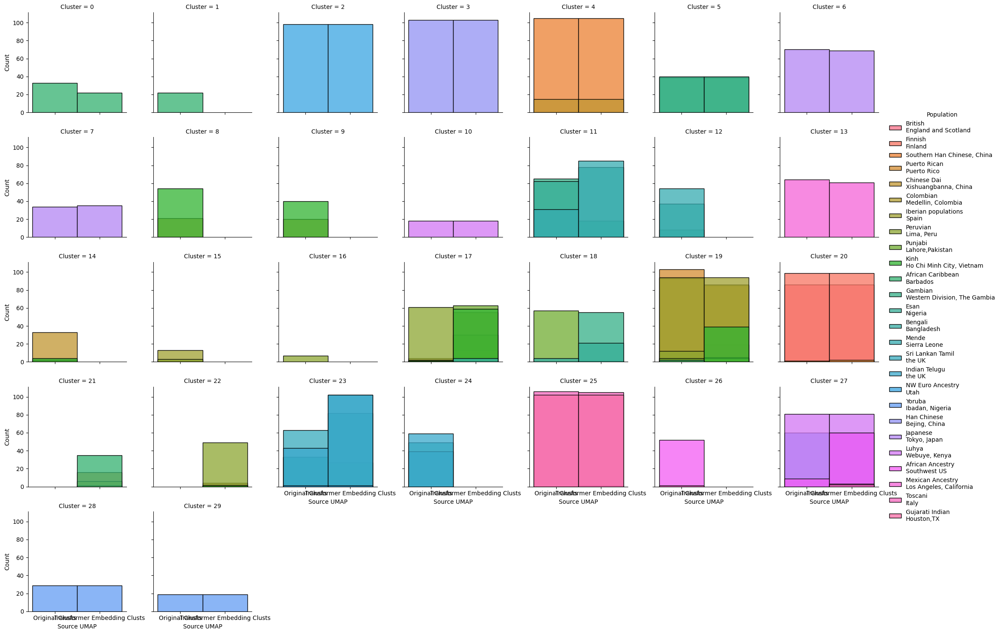

In [621]:
f = sns.FacetGrid(clust_df, col="Cluster", hue="Population", col_wrap=7)
f.map_dataframe(sns.histplot, x="Source UMAP")
f.add_legend()

## Population frequency (?) Plot

In [29]:
def pop_freq(clusters, y, db=False):
    maxclust = np.max(clusters)
    # Get pop freq for each cluster
    clust_props = []
    for i in range(maxclust + 1):
        labs, counts = np.unique(y[np.where(clusters == i)], return_counts=True)
        clust_props.append({labs[j] : counts[j] / np.sum(counts) for j in range(len(labs))})

    popfreqs = [clust_props[i] for i in clusters]
    return popfreqs
        

In [54]:
label_superpops

0          European Ancestry
1          European Ancestry
2          European Ancestry
3          European Ancestry
4          European Ancestry
                ...         
2498    South Asian Ancestry
2499    South Asian Ancestry
2500    South Asian Ancestry
2501    South Asian Ancestry
2502    South Asian Ancestry
Name: 0, Length: 2503, dtype: object

In [68]:
popfreq_embeddings

[{'FIN': 0.532258064516129,
  'GBR': 0.46236559139784944,
  'PUR': 0.005376344086021506},
 {'FIN': 0.532258064516129,
  'GBR': 0.46236559139784944,
  'PUR': 0.005376344086021506},
 {'FIN': 0.532258064516129,
  'GBR': 0.46236559139784944,
  'PUR': 0.005376344086021506},
 {'FIN': 0.532258064516129,
  'GBR': 0.46236559139784944,
  'PUR': 0.005376344086021506},
 {'FIN': 0.532258064516129,
  'GBR': 0.46236559139784944,
  'PUR': 0.005376344086021506},
 {'FIN': 0.532258064516129,
  'GBR': 0.46236559139784944,
  'PUR': 0.005376344086021506},
 {'FIN': 0.532258064516129,
  'GBR': 0.46236559139784944,
  'PUR': 0.005376344086021506},
 {'FIN': 0.532258064516129,
  'GBR': 0.46236559139784944,
  'PUR': 0.005376344086021506},
 {'FIN': 0.532258064516129,
  'GBR': 0.46236559139784944,
  'PUR': 0.005376344086021506},
 {'FIN': 0.532258064516129,
  'GBR': 0.46236559139784944,
  'PUR': 0.005376344086021506},
 {'FIN': 0.532258064516129,
  'GBR': 0.46236559139784944,
  'PUR': 0.005376344086021506},
 {'FIN': 0

In [61]:
popfreq_input = pop_freq(clust_labels.labels_, label_codes["0"].to_numpy())
popfreq_input_superpops = pop_freq(clust_labels.labels_, label_superpops.to_numpy())

popfreq_embeddings = pop_freq(clust_labels_embeddings.labels_, label_codes["0"].to_numpy())
popfreq_embeddings_superpop = pop_freq(clust_labels_embeddings.labels_, label_superpops.to_numpy())

In [62]:
pe_df = pd.melt(pd.DataFrame(popfreq_embeddings), ignore_index=False).reset_index()
pes_df = pd.melt(pd.DataFrame(popfreq_embeddings_superpop), ignore_index=False).reset_index()

pi_df = pd.melt(pd.DataFrame(popfreq_input), ignore_index=False).reset_index()
pis_df = pd.melt(pd.DataFrame(popfreq_input_superpops), ignore_index=False).reset_index()

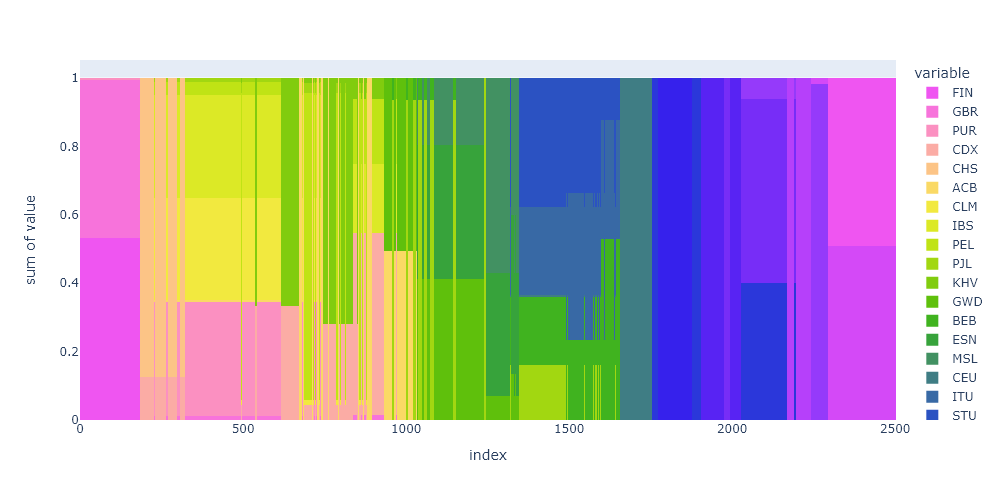

In [67]:
fig = px.histogram(pi_df, x="index", y="value", color="variable", 
                   color_discrete_sequence=colors_all, 
                   nbins=2503)
# fig.update_traces(offset=0, width=1)
fig.update_layout(barmode="stack", width=1000)
fig.show(renderer="png")

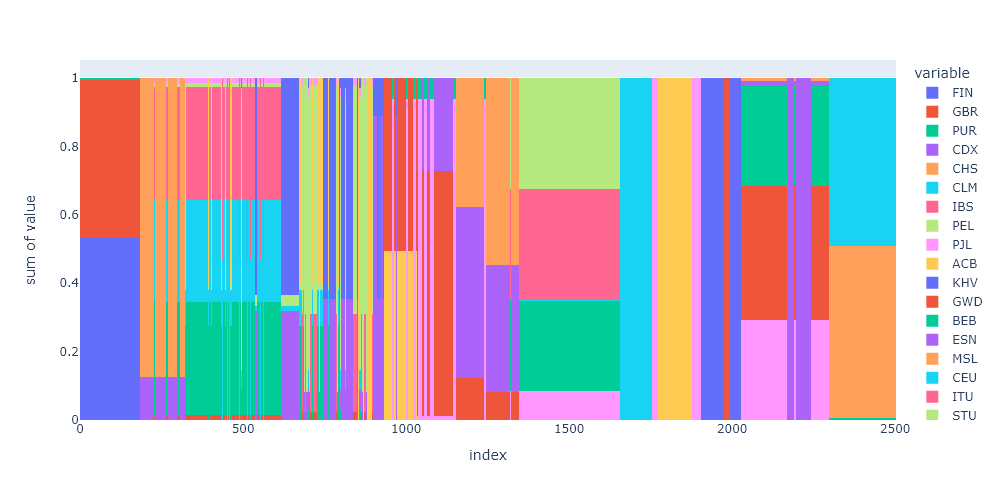

In [66]:
fig = px.histogram(pe_df, x="index", y="value", color="variable",
                   # color_discrete_sequence=colors_all, 
                   nbins=2503)
# fig.update_traces(offset=0, width=1)
fig.update_layout(barmode="stack", width=1000)
fig.show(renderer="png")


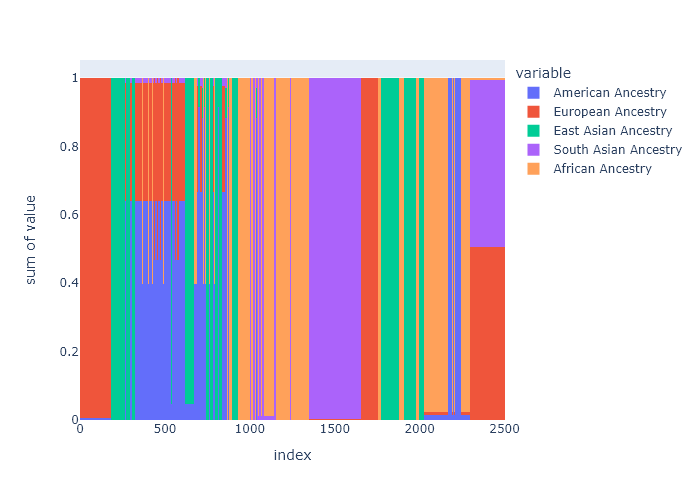

In [58]:
fig = px.histogram(pes_df, x="index", y="value", color="variable", 
                   # color_discrete_sequence=colors_all, 
                   nbins=2503)
# fig.update_traces(offset=0, width=1)
fig.update_layout(barmode="stack")
fig.show(renderer="png")

## Find Interesting Backgrounds of Pple in Clusters

In [54]:
tg_df = pd.read_csv("../Data/igsr_samples.tsv", sep="\t")
matrix_withnames = pd.read_csv("../Data/king_matrix_withnames.csv", index_col=0).fillna(0)

labels_df = pd.DataFrame([matrix_withnames.index, label_codes["0"], label_superpops]).T
labels_df.columns = ["sample", "popcode", "superdesc"]
labels_df

,sample,popcode,superdesc
0,HG00096,GBR,European Ancestry
1,HG00097,GBR,European Ancestry
2,HG00099,GBR,European Ancestry
3,HG00100,GBR,European Ancestry
4,HG00101,GBR,European Ancestry
...,...,...,...
2498,NA21135,GIH,South Asian Ancestry
2499,NA21137,GIH,South Asian Ancestry
2500,NA21141,GIH,South Asian Ancestry
2501,NA21142,GIH,South Asian Ancestry


### Get Backgrounds from Dataset Points

In [104]:
backgrounds_byclust(newclusts[1], clusts=[20])

[            Sex Biosample ID Population code  Population name  \
 sample                                                          
 HG02494  female  SAME1839698             PJL  Punjabi,Punjabi   
 HG02724    male  SAME1839740             PJL  Punjabi,Punjabi   
 HG02783    male  SAME1839162             PJL  Punjabi,Punjabi   
 HG02790  female  SAME1840345             PJL  Punjabi,Punjabi   
 HG03006    male  SAME1840242             BEB  Bengali,Bengali   
 HG03007  female  SAME1840245             BEB  Bengali,Bengali   
 
         Superpopulation code                    Superpopulation name  \
 sample                                                                 
 HG02494                  SAS  South Asia (SGDP),South Asian Ancestry   
 HG02724                  SAS  South Asia (SGDP),South Asian Ancestry   
 HG02783                  SAS  South Asia (SGDP),South Asian Ancestry   
 HG02790                  SAS  South Asia (SGDP),South Asian Ancestry   
 HG03006                  SAS  S

In [101]:
# labels_df.iloc[np.where(clust_labels_embeddings.labels_ == 3)[0], :]
tg_df.set_index("Sample name").join(labels_df.iloc[np.where(newclusts[0] == 20)[0], :].set_index("sample"), how="right")

,Sex,Biosample ID,Population code,Population name,Superpopulation code,Superpopulation name,Population elastic ID,Data collections,popcode,superdesc
sample,,,,,,,,,,
HG01491,male,SAME124140,CLM,Colombian,AMR,American Ancestry,CLM,"1000 Genomes on GRCh38,1000 Genomes 30x on GRC...",CLM,American Ancestry
HG01571,male,SAME124346,PEL,Peruvian,AMR,American Ancestry,PEL,"1000 Genomes on GRCh38,1000 Genomes 30x on GRC...",PEL,American Ancestry
HG01572,female,SAME124705,PEL,Peruvian,AMR,American Ancestry,PEL,"1000 Genomes on GRCh38,1000 Genomes 30x on GRC...",PEL,American Ancestry
HG01800,female,SAME124306,CDX,Dai Chinese,EAS,East Asian Ancestry,CDX,"1000 Genomes on GRCh38,1000 Genomes 30x on GRC...",CDX,East Asian Ancestry
HG01816,male,SAME124521,CDX,Dai Chinese,EAS,East Asian Ancestry,CDX,"1000 Genomes on GRCh38,1000 Genomes 30x on GRC...",CDX,East Asian Ancestry
...,...,...,...,...,...,...,...,...,...,...
HG02299,male,SAME1839994,PEL,Peruvian,AMR,American Ancestry,PEL,"1000 Genomes on GRCh38,1000 Genomes 30x on GRC...",PEL,American Ancestry
HG02304,male,SAME1839548,PEL,Peruvian,AMR,American Ancestry,PEL,"1000 Genomes on GRCh38,1000 Genomes 30x on GRC...",PEL,American Ancestry
HG02392,male,SAME1839776,CDX,Dai Chinese,EAS,East Asian Ancestry,CDX,"1000 Genomes on GRCh38,1000 Genomes 30x on GRC...",CDX,East Asian Ancestry


In [103]:
def get_backgrounds(subset_df = labels_df):
    joined = tg_df.set_index("Sample name").join(subset_df.set_index("sample"), how="right")
    uniques = joined[(joined["Population elastic ID"] != joined["popcode"]) | 
                        ((joined["Superpopulation name"] != joined["superdesc"]))]
    # return joined
    return uniques

def backgrounds_byclust(clustlabels_all, clusts=None):
    if not clusts:
        clusts = range(np.max(clustlabels_all))
        
    uniques = []
    for c in clusts:
        subset = labels_df.iloc[np.where(clustlabels_all == c)[0], :]
        uniques.append(get_backgrounds(subset))

    return uniques
    

In [ ]:
labels_df.iloc[np.where(clustlabels_all == c)[0], :]

In [98]:
f = backgrounds_byclust(newclusts[1])
lens = [len(i) for i in f]
np.argmax(lens)
# lens

20

In [105]:
f = backgrounds_byclust(newclusts_superpops[1])

[len(i) for i in f]

[0,
 0,
 3,
 2,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 2,
 0,
 0,
 0,
 5,
 0,
 0,
 0,
 0,
 3,
 0,
 6,
 1]

In [90]:
f = backgrounds_byclust(newclusts_superpops[1], [12, 23])

[len(i) for i in f]

[0, 0]

In [92]:
f = backgrounds_byclust(newclusts_superpops[1], [12, 23])

print(f[0], f[1])


            Sex Biosample ID Population code    Population name  \
sample                                                            
HG00638  female   SAME123652             PUR       Puerto Rican   
HG01049  female   SAME125248             PUR       Puerto Rican   
HG01052  female   SAME123368             PUR       Puerto Rican   
HG01063    male  SAME1839767             PUR       Puerto Rican   
HG01088    male  SAME1839361             PUR       Puerto Rican   
HG01092  female  SAME1839489             PUR       Puerto Rican   
HG01107    male   SAME123675             PUR       Puerto Rican   
HG01108  female   SAME123103             PUR       Puerto Rican   
HG01125  female   SAME124054             CLM          Colombian   
HG01161    male  SAME1839615             PUR       Puerto Rican   
HG01188  female   SAME124927             PUR       Puerto Rican   
HG01241    male   SAME125065             PUR       Puerto Rican   
HG01242  female   SAME125064             PUR       Puerto Rica

## Find Correlation in Attention Maps

### Load Data

In [34]:
# sample_to_label has sample name to popcode
matrix_withnames = pd.read_csv("../Data/king_matrix_withnames.csv", index_col=0).fillna(0)
codes_to_desc = pd.read_csv('ftp://ftp.1000genomes.ebi.ac.uk/vol1/ftp/phase3/20131219.populations.tsv', sep='\t', header=0)
codes_to_desc = codes_to_desc.set_index("Population Code").to_dict()["Population Description"]

matrix_withnames

,HG00097,HG00099,HG00100,HG00101,HG00102,HG00103,HG00105,HG00106,HG00107,HG00108,...,NA21128,NA21129,NA21130,NA21133,NA21135,NA21137,NA21141,NA21142,NA21143,NA21144
ID1,,,,,,,,,,,,,,,,,,,,,
HG00096,-0.0091,-0.0023,-0.0143,0.0077,0.0092,-0.0053,-0.0048,0.0110,0.0139,0.0005,...,-0.0459,-0.0293,-0.0244,-0.0195,-0.0372,-0.0636,-0.0494,-0.0278,-0.0340,-0.0348
HG00097,0.0000,-0.0004,0.0173,0.0383,0.0283,0.0030,0.0314,0.0288,0.0372,0.0174,...,-0.0055,-0.0287,-0.0041,0.0180,-0.0172,-0.0325,-0.0144,-0.0066,0.0074,-0.0152
HG00099,0.0000,0.0000,0.0147,0.0277,0.0092,0.0093,0.0105,0.0385,0.0093,0.0188,...,-0.0281,-0.0260,-0.0303,-0.0268,-0.0414,-0.0451,-0.0303,-0.0347,-0.0333,-0.0283
HG00100,0.0000,0.0000,0.0000,0.0399,0.0155,-0.0011,0.0134,0.0310,0.0314,-0.0015,...,-0.0189,-0.0323,-0.0148,-0.0220,-0.0312,-0.0362,-0.0205,-0.0278,-0.0235,-0.0265
HG00101,0.0000,0.0000,0.0000,0.0000,0.0344,0.0066,0.0117,0.0369,0.0464,0.0227,...,-0.0025,-0.0253,-0.0018,-0.0017,-0.0309,-0.0345,-0.0067,-0.0162,-0.0113,-0.0150
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NA21135,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.0000,-0.0339,0.0036,0.0099,-0.0065,-0.0013
NA21137,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,-0.0230,-0.0220,-0.0058,-0.0230
NA21141,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0187,0.0126,0.0150


In [451]:
model_output = np.load("../Output/Runs/test6/Test_6_attention_maps_embeddings.npy", allow_pickle=True).item()
del model_output["embeddings"]
model_output

{1: array([[ 0.0529878 ,  0.07273676,  0.0936736 , ...,  0.03178374,
          0.07688263, -0.04851928],
        [ 0.0251726 ,  0.04516617,  0.0420084 , ...,  0.05685366,
          0.09196532, -0.05065406],
        [ 0.06123083,  0.06837776,  0.084405  , ...,  0.04318487,
          0.077626  , -0.04685883],
        ...,
        [-0.00810592,  0.00790248,  0.01100128, ...,  0.01303064,
          0.0150388 , -0.01068914],
        [-0.00826824,  0.00786241,  0.01028145, ...,  0.01281122,
          0.01502013, -0.01032087],
        [-0.00839907,  0.00789657,  0.01086381, ...,  0.01297287,
          0.01518093, -0.01046967]], dtype=float32),
 2: array([[ 0.61277413,  2.374874  ,  0.7851865 , ...,  5.2245445 ,
          0.17274699, -3.2303002 ],
        [ 0.41362777,  2.0961192 ,  0.30991068, ...,  4.4880557 ,
          0.17692168, -2.5418804 ],
        [ 0.6170258 ,  2.4056842 ,  0.7457714 , ...,  5.221988  ,
          0.12305936, -3.1761246 ],
        ...,
        [-0.46891358,  2.1242356 

In [448]:
sample_to_popcode

,Sample name,Population code
0,HG00271,FIN
1,HG00276,FIN
2,HG00288,FIN
3,HG00290,FIN
4,HG00303,FIN
...,...,...
4715,SC_GMMAN5482266,GWD
4752,NA21581,MKK
4824,GM20355,ASW
4963,NA12236,CEU


### Algorithm for finding vals

In [482]:
def find_attention(idx: int, attention_maps: dict, matrix_withnames):
    print(f"\nFor point with label {sample_to_label[matrix_withnames.index[idx]]} ({codes_to_desc[sample_to_label[matrix_withnames.index[idx]]]}), attention values:\n")
    
    for i in model_output.keys():
        print(f"Map {i}:")
        a_row = attention_maps[i][idx, :]
        std, mean = np.std(a_row), np.mean(a_row)
        idxs = np.where((a_row > (mean + std * 3)) | (a_row < (mean - std * 3)))
        print(matrix_withnames.columns[idxs].map(sample_to_label).map(codes_to_desc).to_list())
        print(mean, std)

In [516]:
find_attention(0, model_output, matrix_withnames)
find_attention(30, model_output, matrix_withnames)
find_attention(945, model_output, matrix_withnames)
find_attention(2502, model_output, matrix_withnames)


For point with label GBR (British in England and Scotland), attention values:

Map 1:
['Colombian in Medellin, Colombia', 'Chinese Dai in Xishuangbanna, China', 'Punjabi in Lahore,Pakistan', 'Esan in Nigeria', 'Bengali in Bangladesh', 'Mexican Ancestry in Los Angeles, California', 'Mexican Ancestry in Los Angeles, California', 'Toscani in Italy', 'Gujarati Indian in Houston,TX']
0.00075342995 0.06538676
Map 2:
['Southern Han Chinese, China', 'Puerto Rican in Puerto Rico', 'Yoruba in Ibadan, Nigeria']
-0.028558597 2.7449486
Map 3:
['Yoruba in Ibadan, Nigeria']
0.030221915 3.7343035
Map 4:
['British in England and Scotland', 'Finnish in Finland', 'Southern Han Chinese, China', 'Puerto Rican in Puerto Rico', 'Puerto Rican in Puerto Rico', 'British in England and Scotland', 'British in England and Scotland', 'Punjabi in Lahore,Pakistan', 'Punjabi in Lahore,Pakistan', 'Indian Telugu in the UK', 'Han Chinese in Bejing, China', 'Yoruba in Ibadan, Nigeria', 'Yoruba in Ibadan, Nigeria', 'Luhya

In [469]:
codes_to_desc

{'CDX': 'Chinese Dai in Xishuangbanna, China',
 'CHB': 'Han Chinese in Bejing, China',
 'JPT': 'Japanese in Tokyo, Japan',
 'KHV': 'Kinh in Ho Chi Minh City, Vietnam',
 'CHS': 'Southern Han Chinese, China',
 'BEB': 'Bengali in Bangladesh',
 'GIH': 'Gujarati Indian in Houston,TX',
 'ITU': 'Indian Telugu in the UK',
 'PJL': 'Punjabi in Lahore,Pakistan',
 'STU': 'Sri Lankan Tamil in the UK',
 'ASW': 'African Ancestry in Southwest US',
 'ACB': 'African Caribbean in Barbados',
 'ESN': 'Esan in Nigeria',
 'GWD': 'Gambian in Western Division, The Gambia',
 'LWK': 'Luhya in Webuye, Kenya',
 'MSL': 'Mende in Sierra Leone',
 'YRI': 'Yoruba in Ibadan, Nigeria',
 'GBR': 'British in England and Scotland',
 'FIN': 'Finnish in Finland',
 'IBS': 'Iberian populations in Spain',
 'TSI': 'Toscani in Italy',
 'CEU': 'Utah residents with Northern and Western European ancestry',
 'CLM': 'Colombian in Medellin, Colombia',
 'MXL': 'Mexican Ancestry in Los Angeles, California',
 'PEL': 'Peruvian in Lima, Peru'

# TODO

* ~~Make vis of drawing I did~~
* Try flipping matrix across diagonal to fill zeros
* Embeddings from all encoder layers, matrix img AND UMAP embedding viz
    * Also viz model parameters


In [454]:
# matrix_withnames.index[0]
model_output[1][1, :]

array([ 0.0251726 ,  0.04516617,  0.0420084 , ...,  0.05685366,
        0.09196532, -0.05065406], dtype=float32)

In [452]:
model_output.keys()

dict_keys([1, 2, 3, 4, 5, 6])

In [466]:
matrix_withnames.columns[[0, 4, 5]].map(sample_to_label).to_list()

['GBR', 'GBR', 'GBR']

In [480]:
# GWD
matrix_withnames.index.map(sample_to_label).get_loc("GWD").argmax()

945

In [513]:
np.argmax(matrix_withnames.to_numpy())
np.unravel_index(5270921, (2503, 2503))

(2105, 2106)

In [514]:
matrix_withnames.to_numpy()[np.unravel_index(5270921, (2503, 2503))]

0.3828

In [511]:
matrix_withnames.to_numpy().shape

(2503, 2503)